<a href="https://colab.research.google.com/github/PvPaulinho/Deep-Learning-Facul-/blob/main/Tarefa8_DeteccaoMascara.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

# Tarefa 8 - Detecção de máscaras com YOLOv5

Nessa tarefa, treinaremos o YOLOv5 para detectar se as pessoas nas imagens estão portando ou não máscaras. 

Um conjunto segmentado, disponibilizado pela Roboflow e complementado com outras imagens encontradas na internet será utilizado. 

1. Você deverá treinar a rede conforme a Lição 16. 
2. Verifique o treinamento com as imagens do conjunto de teste 
3. Opcional - Teste o YOLOv5 com um vídeo do Youtube ou feito por você.  Compartilhe o link do vídeo. 
4. Opcional - Treine o modelo com YOLOv5n (nano YOLOv5, veja a lição 16bis)


## Instalação e inicialização do YOLOv5

In [1]:
#clone YOLOv5 and 
!git clone https://github.com/ultralytics/yolov5  # clone repo
%cd yolov5
%pip install -qr requirements.txt # install dependencies
%pip install -q roboflow

import torch
import os
from IPython.display import Image, clear_output  # to display images

print(f"Setup complete. Using torch {torch.__version__} ({torch.cuda.get_device_properties(0).name if torch.cuda.is_available() else 'CPU'})")

Cloning into 'yolov5'...
remote: Enumerating objects: 10226, done.
remote: Total 10226 (delta 0), reused 0 (delta 0), pack-reused 10226
Receiving objects: 100% (10226/10226), 10.53 MiB | 9.24 MiB/s, done.
Resolving deltas: 100% (7060/7060), done.
/content/yolov5
     |████████████████████████████████| 596 kB 5.2 MB/s 
     |████████████████████████████████| 145 kB 5.3 MB/s 
     |████████████████████████████████| 178 kB 43.8 MB/s 
     |████████████████████████████████| 1.1 MB 31.6 MB/s 
     |████████████████████████████████| 67 kB 5.4 MB/s 
     |████████████████████████████████| 138 kB 52.6 MB/s 
     |████████████████████████████████| 62 kB 801 kB/s 
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
google-colab 1.0.0 requires requests~=2.23.0, but you have requests 2.26.0 which is incompatible.
datascience 0.10.6 requires folium==0.2.1, but you have folium 0

In [2]:
!wget https://github.com/jsansao/MaskWearing_YoloV5/archive/refs/heads/main.zip -O Masks.zip
!unzip Masks.zip -d /content/
!mv /content/MaskWearing_YOLOv5-main/* /content/

--2021-12-17 01:20:45--  https://github.com/jsansao/MaskWearing_YoloV5/archive/refs/heads/main.zip
Resolving github.com (github.com)... 140.82.112.3
Connecting to github.com (github.com)|140.82.112.3|:443... connected.
HTTP request sent, awaiting response... 302 Found
Location: https://codeload.github.com/jsansao/MaskWearing_YOLOv5/zip/refs/heads/main [following]
--2021-12-17 01:20:45--  https://codeload.github.com/jsansao/MaskWearing_YOLOv5/zip/refs/heads/main
Resolving codeload.github.com (codeload.github.com)... 140.82.113.9
Connecting to codeload.github.com (codeload.github.com)|140.82.113.9|:443... connected.
HTTP request sent, awaiting response... 200 OK
Length: unspecified [application/zip]
Saving to: ‘Masks.zip’

Masks.zip               [         <=>        ]  50.03M  24.3MB/s    in 2.1s    

2021-12-17 01:20:48 (24.3 MB/s) - ‘Masks.zip’ saved [52464773]

Archive:  Masks.zip
8935956a7c3ce9fe41b38ca2bd3f82edfdeafb2e
   creating: /content/MaskWearing_YOLOv5-main/
  inflating: /co

## Treinamento 

In [3]:
!python train.py --img 416 --batch 16 --epochs 150 --data /content/data.yaml --weights yolov5n.pt --cache

train: weights=yolov5n.pt, cfg=, data=/content/data.yaml, hyp=data/hyps/hyp.scratch.yaml, epochs=150, batch_size=16, imgsz=416, rect=False, resume=False, nosave=False, noval=False, noautoanchor=False, evolve=None, bucket=, cache=ram, image_weights=False, device=, multi_scale=False, single_cls=False, adam=False, sync_bn=False, workers=8, project=runs/train, name=exp, exist_ok=False, quad=False, linear_lr=False, label_smoothing=0.0, patience=100, freeze=0, save_period=-1, local_rank=-1, entity=None, upload_dataset=False, bbox_interval=-1, artifact_alias=latest
github: up to date with https://github.com/ultralytics/yolov5 ✅
YOLOv5 🚀 v6.0-148-gc1249a4 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

hyperparameters: lr0=0.01, lrf=0.1, momentum=0.937, weight_decay=0.0005, warmup_epochs=3.0, warmup_momentum=0.8, warmup_bias_lr=0.1, box=0.05, cls=0.5, cls_pw=1.0, obj=1.0, obj_pw=1.0, iou_t=0.2, anchor_t=4.0, fl_gamma=0.0, hsv_h=0.015, hsv_s=0.7, hsv_v=0.4, degrees=0.0, translate=0.1, scale=0.

In [4]:
%load_ext tensorboard
%tensorboard --logdir runs

<IPython.core.display.Javascript object>

## Inferência do conjunto de teste

In [5]:
!python detect.py --weights runs/train/exp/weights/best.pt --img 416 --conf 0.1 --source /content/test/images

detect: weights=['runs/train/exp/weights/best.pt'], source=/content/test/images, imgsz=[416, 416], conf_thres=0.1, iou_thres=0.45, max_det=1000, device=, view_img=False, save_txt=False, save_conf=False, save_crop=False, nosave=False, classes=None, agnostic_nms=False, augment=False, visualize=False, update=False, project=runs/detect, name=exp, exist_ok=False, line_thickness=3, hide_labels=False, hide_conf=False, half=False, dnn=False
YOLOv5 🚀 v6.0-148-gc1249a4 torch 1.10.0+cu111 CUDA:0 (Tesla K80, 11441MiB)

Fusing layers... 
Model Summary: 213 layers, 1761871 parameters, 0 gradients, 4.2 GFLOPs
image 1/15 /content/test/images/0_Concern-In-China-As-Mystery-Virus-Spreads_jpg.rf.5633f5fe7a9b926101b7fc16615dfb6a.jpg: 224x416 4 masks, Done. (0.017s)
image 2/15 /content/test/images/1224331650_g_400-w_g_jpg.rf.483a35a2395bf48e96783587a59fe876.jpg: 416x416 4 masks, Done. (0.018s)
image 3/15 /content/test/images/126202-untitled-design-13_jpg.rf.baa3d2e55d469ae5d5d4cd81c4603e1d.jpg: 256x416 5 ma

## Inferência no vídeo

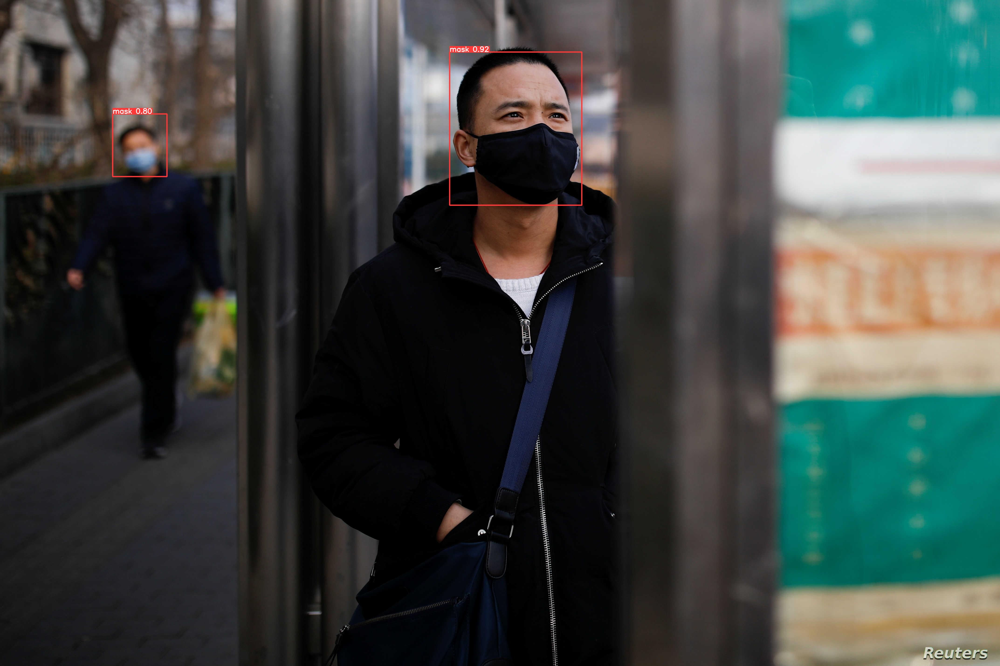

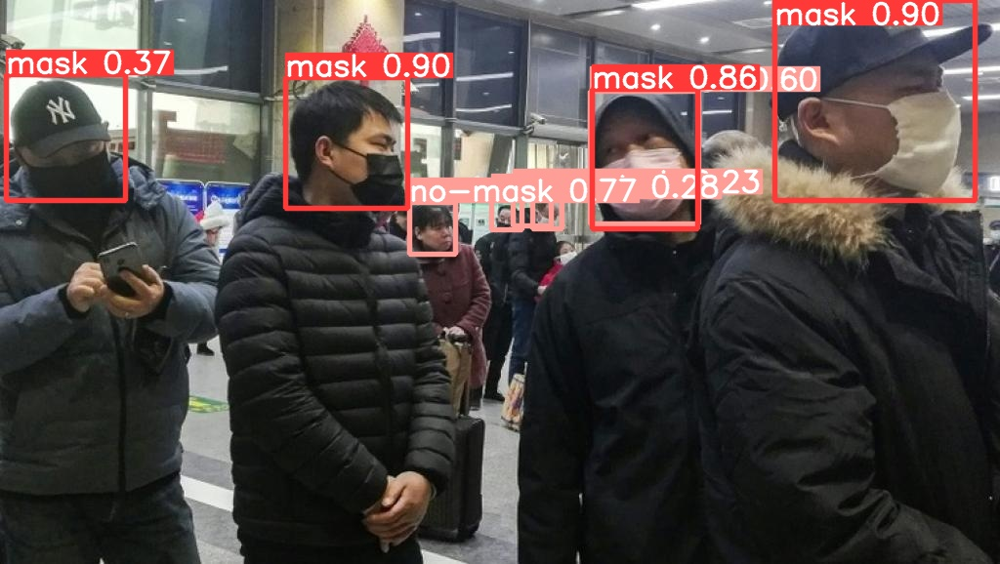

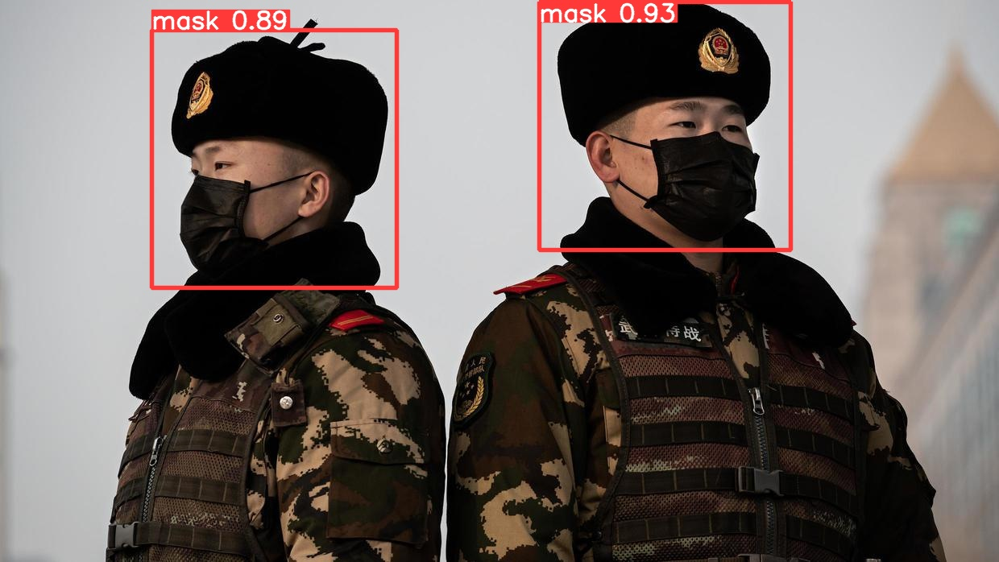

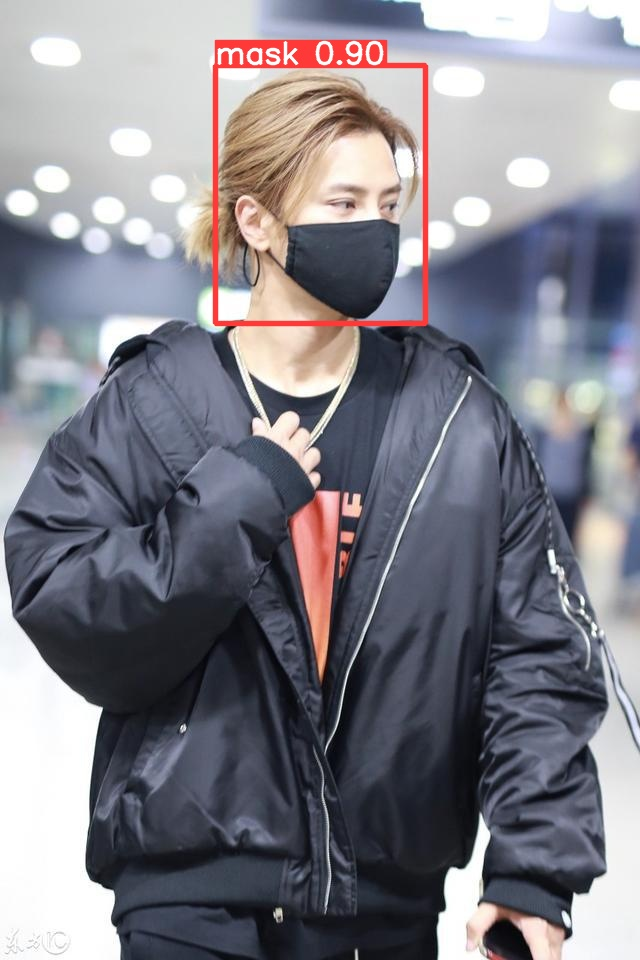

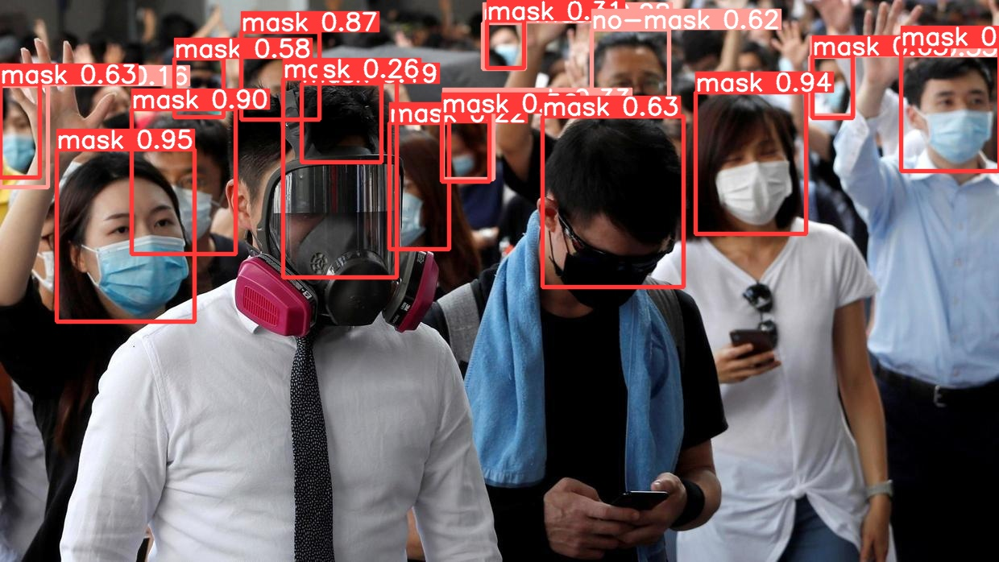

...

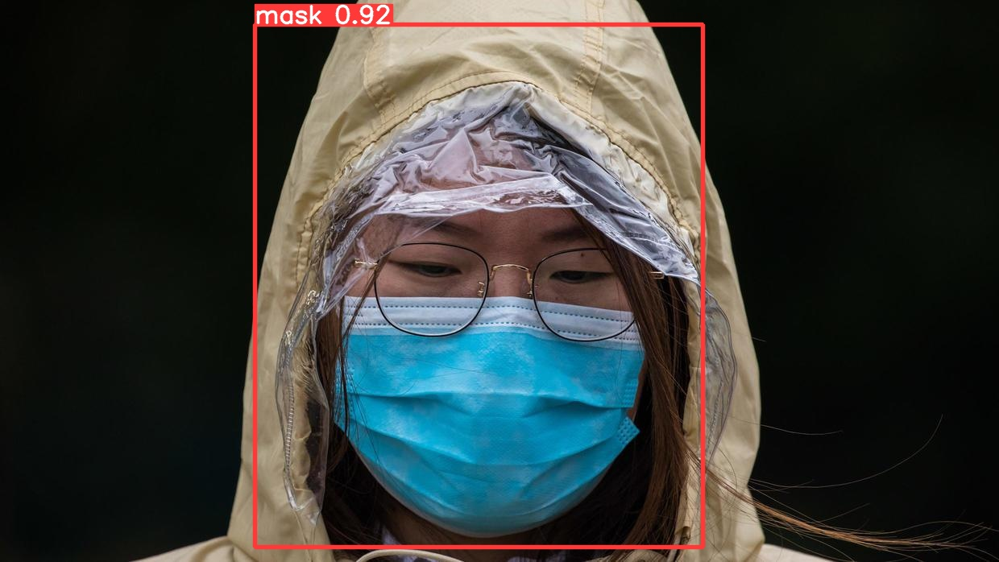

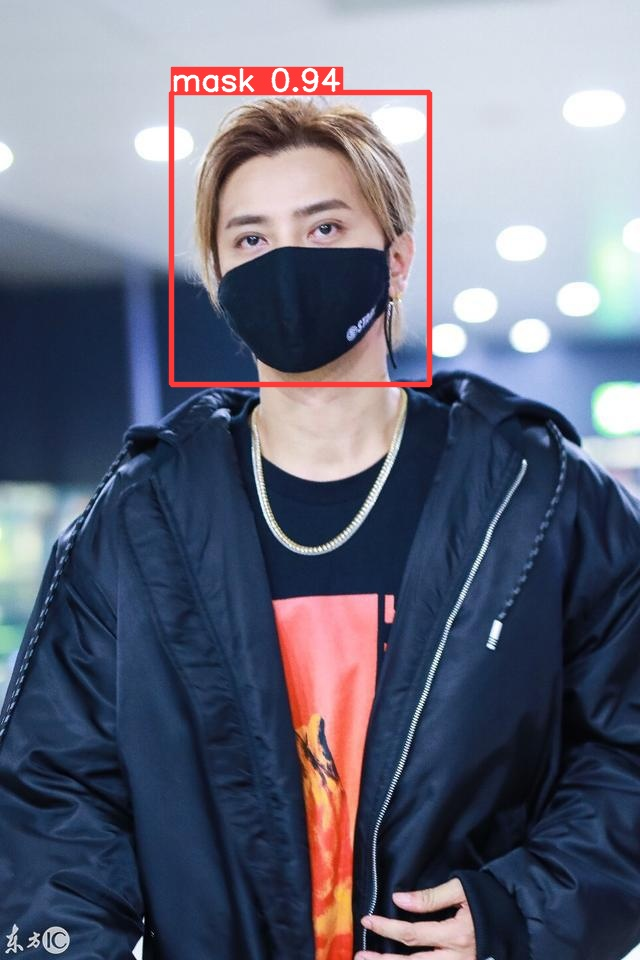

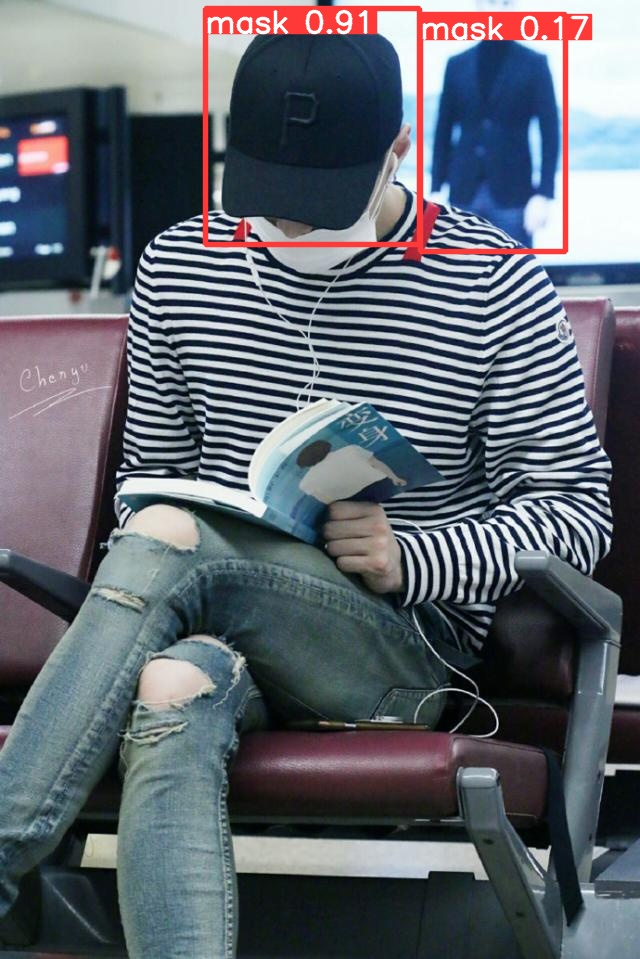

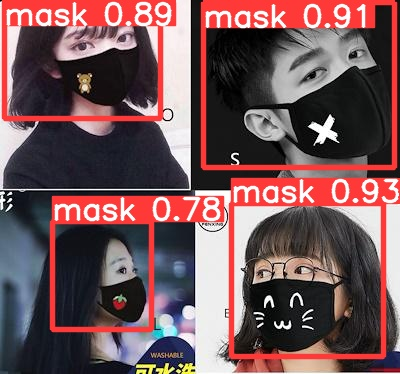

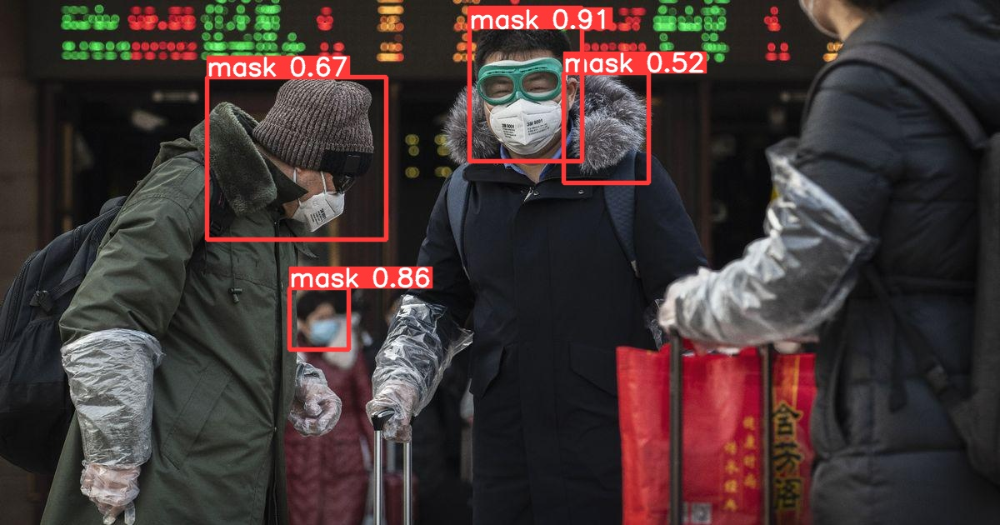

In [6]:
import glob
from IPython.display import Image, display

for imageName in glob.glob('/content/yolov5/runs/detect/exp/*.jpg'): #assuming JPG
    display(Image(filename=imageName))
    print("\n")